In [1]:
from ember import Config, Paths, InitialCondition, StrainParameters, General, Times, TerminationCondition, ConcreteConfig, General, Debug, RK23Tolerances
import matplotlib.pyplot as plt

output = 'run/ex_diffusion9'
import numpy as np
import matplotlib.pyplot as plt
import h5py
import cantera as ct
import os
import time
from ember import _ember

mamba activate ember-build1   


In [2]:
# get index for CH4, O2, N2, H2O, CO2, CO
gas = ct.Solution('gri30.yaml')
names = gas.species_names
ch4_index = names.index('CH4')
o2_index = names.index('O2')
n2_index = names.index('N2')
h2o_index = names.index('H2O')
co2_index = names.index('CO2')
co_index = names.index('CO')
oh_index = names.index('OH')


In [29]:


conf = Config(
    Paths(outputDir='run/ex_diffusion19'),
    General(nThreads=1,
            chemistryIntegrator='qss'),
    InitialCondition(Tfuel=600,
                     Toxidizer=1200,
                     centerWidth=0.0,
                     equilibrateCounterflow=False,
                     flameType='diffusion',
                     slopeWidth=0.0,
                     xLeft=-0.02,
                     pressure=101325,
                     xRight=0.02,
                     nPoints=100),
    StrainParameters(final=100,
                     initial=100),
    Times(globalTimestep=1e-05,
          profileStepInterval=20),
    TerminationCondition(abstol=0.0,
                         dTdtTol=0,
                         steadyPeriod=1.0,
                         tEnd=0.08,
                         tolerance=0.0),
    RK23Tolerances(
        absoluteTolerance=1e-8,
        relativeTolerance=1e-6,
        minimumTimestep=1e-10,
        maximumTimestep=1e-4,
        maxStepsNumber=100000,
    ),
    Debug(veryVerbose=True),)


conf = ConcreteConfig(conf)

jm = 49


In [30]:
confString = conf.original.stringify()

if not os.path.isdir(conf.paths.outputDir):
    os.makedirs(conf.paths.outputDir, 0o0755)
confOutPath = os.path.join(conf.paths.outputDir, 'config')
if (os.path.exists(confOutPath)):
    os.unlink(confOutPath)
confOut = open(confOutPath, 'w')
confOut.write(confString)

# def set_integrator_heuristic(solver, constant_int=None):
#     """
#     Set integrator type based on temperature and mixture composition.
#     Uses boostRK for:
#     - Low temperatures (< 600K)
#     - Pure fuel or pure oxidizer regions (phi near 0 or very large)
#     Uses CVODE for:
#     - Active reaction zones with intermediate equivalence ratios
    
#     Args:
#         solver: FlameSolver instance
#         constant_int: If provided, forces first n points to use specified integrator
    
#     Returns:
#         list: Integrator types for each grid point
#     """
#     nPoints = len(solver.T)
    
#     # Start with temperature-based decision
#     integ = np.where(solver.T <= 600.0, 'boostRK', 'cvode')
    
#     try:
#         # Try to get equivalence ratios, handle potential errors
#         phi = solver.phi
        
#         # Use boostRK for:
#         # - effectively zero phi (pure oxidizer)
#         # - very large phi (pure fuel)
#         # - invalid phi (-1)
#         integ = np.where(np.abs(phi) <= 1e-8, 'boostRK', integ)  # pure oxidizer
#         integ = np.where(phi == -1, 'boostRK', integ)  # invalid/undefined
        
#     except Exception as e:
#         print(f"Warning: Could not calculate phi for integrator selection: {e}")
#         # Fall back to temperature-only criterion if phi calculation fails
#         pass
    
#     # Convert to list
#     integ = integ.tolist()
    
#     # Override with constant integrator if specified
#     if constant_int:
#         n = min(100, nPoints)  # Ensure n doesn't exceed grid size
#         integ = [constant_int] * n + ['cvode'] * (nPoints - n)
    
#     return integ

def set_integrator_heuristic(solver, constant_int=None):
    """
    Set integrator type based on phi (equivalence ratio).
    Uses CVODE for active reaction zones where:
    - phi is between ~0.1 and ~10 (indicating mixed fuel/oxidizer)
    - Temperature is high enough for reactions
    Uses boostRK elsewhere (pure fuel, pure oxidizer, or cold regions)
    """
    nPoints = len(solver.T)
    
    # Start with temperature-based decision
    integ = np.where(solver.T <= 600.0, 'boostRK', 'cvode')
    
    try:
        # Get equivalence ratio
        phi = solver.phi
        
        # Use boostRK for:
        # - phi == -1 (invalid/undefined regions)
        # - phi < 0.1 (very lean, mostly oxidizer)
        # - phi > 10 (very rich, mostly fuel)
        integ = np.where(phi == -1, 'boostRK', integ)  # invalid phi
        integ = np.where(phi <= 1e-8, 'boostRK', integ)  # oxidizer-dominated
        integ = np.where(phi >= 1e4, 'boostRK', integ)   # fuel-dominated
        
        # Create boolean mask for CVODE points
        cvode_mask = (integ == 'cvode')
        
        # Shift masks to check neighbors
        cvode_mask_left = np.roll(cvode_mask, 1)
        cvode_mask_right = np.roll(cvode_mask, -1)
        
        # Fix boundary conditions
        cvode_mask_left[0] = False
        cvode_mask_right[-1] = False
        
        # If either neighbor is CVODE, use CVODE
        use_cvode = cvode_mask | cvode_mask_left | cvode_mask_right
        integ = np.where(use_cvode, 'cvode', 'boostRK')
        
    except Exception as e:
        print(f"Warning: Could not calculate phi for integrator selection: {e}")
        # Fall back to temperature-only criterion if phi calculation fails
        pass
    
    # Convert to list
    integ = integ.tolist()
    
    # Override with constant integrator if specified
    if constant_int:
        n = min(100, nPoints)
        integ = [constant_int] * n + ['cvode'] * (nPoints - n)
    
    return integ

In [5]:
solver = _ember.FlameSolver(conf)
solver.initialize()

prev_T = solver.T 
prev_Y = solver.Y
prev_x = solver.x
integrator_types = set_integrator_heuristic(solver, constant_int=None)
solver.set_integrator_types(integrator_types)


In [11]:
start_time = time.time()
for i, (T, int_type) in enumerate(zip(solver.T, integrator_types)):
    Y = solver.Y[:,i]
    
    phi = solver.phi[i]
    print(f"i: {i} int_type: {int_type}  T: {T}  CH4: {Y[ch4_index]}  O2: {Y[o2_index]}  H2O: {Y[h2o_index]}  CO2: {Y[co2_index]}  CO: {Y[co_index]}  OH: {Y[oh_index]}  phi: {phi} ")
print(time.time() - start_time)


i: 0 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0  phi: -1.0 
i: 1 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 2.160310980247353e-189  H2O: 3.993188590223573e-219  CO2: 6.373913088139357e-242  CO: 4.4321168319610195e-223  OH: 1.4077925828535066e-216  phi: 1.8465070629817336e+189 
i: 2 int_type: boostRK  T: 600.0000000000018  CH4: 1.0  O2: 8.71077761843058e-185  H2O: 1.5036614098009341e-214  CO2: 4.540362779132335e-237  CO: 1.814186642104613e-218  OH: 4.546567469015022e-212  phi: 4.5794183458702876e+184 
i: 3 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 3.4789026464761696e-180  H2O: 5.634427654879858e-210  CO2: 3.218135577924461e-232  CO: 7.362119133653997e-214  OH: 1.4679523455791758e-207  phi: 1.146634409935062e+180 
i: 4 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 1.3769786086652972e-175  H2O: 2.104009351004879e-205  CO2: 2.26898003590729e-227  CO: 2.964701531751661e-209  OH: 4.7424955315586173e-203  phi: 2.896943683918436e+175 
i: 5 int_type: boos

In [32]:
solver = _ember.FlameSolver(conf)
solver.initialize()

integrator_type = np.random.choice(['boostRK', 'cvode'], size=100)  
integrator_type = integrator_type.tolist()
solver.set_integrator_types(integrator_type)

start_time = time.time()
done = solver.step()
time_taken = time.time() - start_time
print(f"TIME TAKEN: {time_taken}") 

: 

In [8]:

start_time = time.time()
done = solver.step()
time_taken = time.time() - start_time
print(f"TIME TAKEN: {time_taken}") 


Writing output file: run/ex_diffusion19/prof000000.h5
Error at j = 50. Gas state:

 k        Species     X Initial    X Final     Delta X
----  --------------  ----------  ----------  ----------
                   T        1113       -1331       -2444
   0              H2           0      0.3345      0.3345
   1               H           0       2.988       2.988
   2               O           0   -0.002285   -0.002285
   3              O2      0.1612     -0.4336     -0.5948
   4              OH           0    -0.02021    -0.02021
   5             H2O           0  -0.0004008  -0.0004008
   6             HO2           0     0.07259     0.07259
   7            H2O2           0  -8.383e-06  -8.383e-06
  11          CH2(S)           0   5.996e-06   5.996e-06
  12             CH3           0    -0.01069    -0.01069
  13             CH4      0.2329     -0.5275     -0.7604
  19            CH3O           0   1.401e-05   1.401e-05
  34             NNH           0      -3.719      -3.719
  47   

In [13]:
done = False
integrator_types = set_integrator_heuristic(solver, constant_int=None)
solver.set_integrator_types(integrator_types)
done = solver.step()
print(f"NUMBER OF BOOSTRK STEPS: {integrator_types.count('boostRK')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
# while not done:
    
#     #print(f"NUMBER OF SEULEX STEPS: {integrator_types.count('rk23')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
#     done = solver.step()



t = 0.000002 (dt = 1.000e-06) [C: 169]
NUMBER OF BOOSTRK STEPS: 88  NUMBER OF CVODE STEPS: 12


In [ ]:
# prev_T = solver.T
# prev_Y = solver.Y
# prev_x = solver.x
integrator_types = set_integrator_heuristic(solver.T, constant_int=None)
print(f"NUMBER OF SEULEX STEPS: {integrator_types.count('seulex')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
solver.set_integrator_types(integrator_types)
start_time = time.time()
done = solver.step()
print(time.time() - start_time)


In [ ]:
plt.plot(solver.x, solver.T, label='after 1 step')
plt.plot(prev_x, prev_T, label='before 1 step')
plt.legend()
plt.show()


In [185]:
def run_solver(constant_int=None):
    
    print(f"Starting solver with {constant_int} constant integration")
    integrator_types = set_integrator_heuristic(solver, constant_int=constant_int)
    if not constant_int:
        print(f"NUMBER OF BOOSTRK STEPS: {integrator_types.count('boostRK')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
    solver.set_integrator_types(integrator_types)

    
    done = False
    start_time = time.time()
    while not done:
        if not constant_int:
            integrator_types = set_integrator_heuristic(solver, constant_int=None)
            print(f"NUMBER OF BOOSTRK STEPS: {integrator_types.count('boostRK')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
            solver.set_integrator_types(integrator_types)

        done = solver.step()
    time_taken = time.time() - start_time
    if constant_int:
        print(f"{constant_int} constant integration took {time_taken} seconds")
    return solver.T, solver.Y, time_taken

In [186]:
solver = _ember.FlameSolver(conf)
solver.initialize()


In [187]:
integrator_types = set_integrator_heuristic(solver, constant_int=None)
print(f"NUMBER OF BOOSTRK STEPS: {integrator_types.count('boostRK')}  NUMBER OF CVODE STEPS: {integrator_types.count('cvode')}")
solver.set_integrator_types(integrator_types)

NUMBER OF BOOSTRK STEPS: 90  NUMBER OF CVODE STEPS: 10
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Set

In [188]:
for i, (T, int_type) in enumerate(zip(solver.T, integrator_types)):
    Y = solver.Y[:,i]
    print(f"i: {i} int_type: {int_type}  T: {T}  CH4: {Y[ch4_index]}  O2: {Y[o2_index]}  H2O: {Y[h2o_index]}  CO2: {Y[co2_index]}  CO: {Y[co_index]}  OH: {Y[oh_index]}, phi: {solver.phi[i]}")


i: 0 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 1 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 2 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 3 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 4 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 5 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 6 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 7 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 8 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 9 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, 

In [189]:

done = solver.step()



Writing output file: run/ex_diffusion19/prof000000.h5
t = 0.000001 (dt = 1.000e-06) [C: 168]


In [196]:
solver = _ember.FlameSolver(conf)
solver.initialize()
T, Y, time_taken = run_solver(constant_int=None)
T_boostRK = T
Y_boostRK = Y

Starting solver with None constant integration
NUMBER OF BOOSTRK STEPS: 90  NUMBER OF CVODE STEPS: 10
NUMBER OF BOOSTRK STEPS: 90  NUMBER OF CVODE STEPS: 10
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostRK system
Initializing BoostRK
Setting BoostRK options
Creating BoostR

In [ ]:



solver = _ember.FlameSolver(conf)
solver.initialize()
T, Y, time_taken = run_solver(constant_int='cvode')
T_cvode = T
Y_cvode = Y


In [ ]:
solver.Y[:,0].shape

In [194]:
integrator_types = set_integrator_heuristic(solver, constant_int=None)
for i, (T, int_type) in enumerate(zip(solver.T, integrator_types)):
    Y = solver.Y[:,i]
    print(f"i: {i} int_type: {int_type}  T: {T}  CH4: {Y[ch4_index]}  O2: {Y[o2_index]}  H2O: {Y[h2o_index]}  CO2: {Y[co2_index]}  CO: {Y[co_index]}  OH: {Y[oh_index]}, phi: {solver.phi[i]}")


i: 0 int_type: boostRK  T: 600.0  CH4: 1.0  O2: 0.0  H2O: 0.0  CO2: 0.0  CO: 0.0  OH: 0.0, phi: -1.0
i: 1 int_type: boostRK  T: 600.0000000000013  CH4: 1.0  O2: 2.087149925439585e-59  H2O: 1.1565035358556234e-62  CO2: 2.0671732299177257e-69  CO: 1.3794101176387103e-65  OH: 1.0886293198405623e-70, phi: 1.9102900791053833e+59
i: 2 int_type: boostRK  T: 600.0000000000036  CH4: 1.0  O2: 2.25823166249316e-56  H2O: 1.1037614305779204e-59  CO2: 2.8035945892940334e-66  CO: 1.5230436393965418e-62  OH: 8.189723002108403e-68, phi: 1.7656704209811578e+56
i: 3 int_type: boostRK  T: 600.0000000000028  CH4: 1.0  O2: 2.4451085502489635e-53  H2O: 1.054318015780797e-56  CO2: 3.8044138111328885e-63  CO: 1.6828219203935508e-59  OH: 6.168015441448321e-65, phi: 1.6308054876423347e+53
i: 4 int_type: boostRK  T: 600.0000000000026  CH4: 1.0  O2: 2.6469368538829997e-50  H2O: 1.0068944108836713e-53  CO2: 5.161501577692264e-60  CO: 1.8590018463878024e-56  OH: 4.644459988102664e-62, phi: 1.5065247949834017e+50
i: 

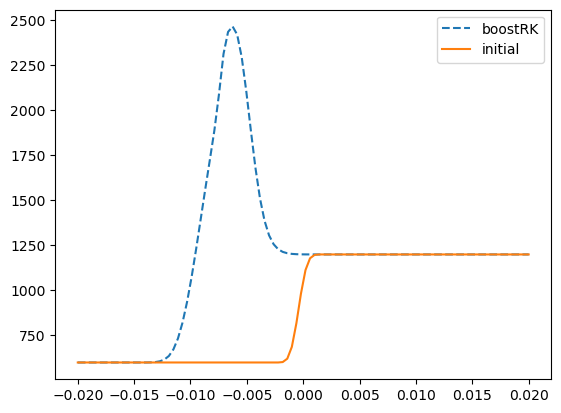

In [197]:
# compare cvode and seulex and initial conditions (prev_T) 

# plt.plot(solver.x, T_cvode, label='cvode')
plt.plot(solver.x, T_boostRK, label='boostRK', linestyle='dashed')
plt.plot(prev_x, prev_T, label='initial')
plt.legend()
plt.show()


In [ ]:
# plot the ch4, o2, h2o, co2, co, oh, ch3
ch3_index = names.index('CH3')
# plt.plot(solver.x, Y_cvode[ch4_index,:], label='ch4_cvode')
# plt.plot(solver.x, Y_cvode[o2_index,:], label='o2_cvode')
# plt.plot(solver.x, Y_cvode[h2o_index,:], label='h2o_cvode')
# plt.plot(solver.x, Y_cvode[co2_index,:], label='co2_cvode')
# plt.plot(solver.x, Y_cvode[co_index,:], label='co_cvode')
# plt.plot(solver.x, Y_cvode[oh_index,:], label='oh_cvode')
# plt.plot(solver.x, Y_cvode[ch3_index,:], label='ch3_cvode')
# plt.plot(solver.x, Y_boostRK[ch4_index,:], label='ch4_boostRK')
# plt.plot(solver.x, Y_boostRK[o2_index,:], label='o2_boostRK')
plt.plot(solver.x, Y_boostRK[h2o_index,:], label='h2o_boostRK')
plt.plot(solver.x, Y_boostRK[co2_index,:], label='co2_boostRK')
plt.plot(solver.x, Y_boostRK[co_index,:], label='co_boostRK')
plt.plot(solver.x, Y_boostRK[oh_index,:], label='oh_boostRK')
plt.plot(solver.x, Y_boostRK[ch3_index,:], label='ch3_boostRK') 
plt.legend()
plt.show()

CVODE = 36.502089977264404 
QSS = 98.013347864151
SEULEX = 3.4927890300750732

In [ ]:
solver.state_T

In [ ]:
# plt.plot(solver.x, solver.state_T, label='after 1 step f')
# plt.plot(prev_x, prev_T, label='before 1 step')
plt.plot(solver.x, solver.T, label='after 1 step')

plt.legend()
plt.show()


In [ ]:
plt.plot(solver.x, solver.Y[ch4_index, :], label='CH4')
plt.plot(solver.x, solver.Y[o2_index, :], label='O2')
plt.plot(solver.x, solver.Y[h2o_index, :], label='H2O')
plt.plot(solver.x, solver.state_Y[:, ch4_index], label='CH4 f')
plt.plot(solver.x, solver.state_Y[:, o2_index], label='O2 f')
plt.plot(solver.x, solver.state_Y[:, h2o_index], label='H2O f')
plt.legend()
plt.show()

In [ ]:
# done = 0
# i = 1
# plot_freq = 10
# print(solver.T[21:51])
# while not done:
#     done = solver.step()
#     if i % 5 == 0:
#         visualizer.save_state()
        
#     # if i % plot_freq == 0:  
#     #     plot_flame(solver, i, i*1e-4)
       
#     i += 1
# solver.finalize()

In [16]:
struct_file = 'run/ex_diffusion11/profNow.h5'
struct = h5py.File(struct_file, 'r')

x = struct['x'][:]
Y = struct['Y'][:]
V = struct['V'][:]
T = struct['T'][:]

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=200)
plt.plot(prev_x, prev_T, label='cpp(0.0)', color='red')
plt.plot(solver.x, solver.T, label='cpp (0.08)', linestyle='dashed')
plt.plot(x, T, label='cpp (0.01)', linestyle='dashdot')
plt.plot(xhis[0], This[0], label='python (0.0)', linestyle='dotted')
plt.plot(xhis[-1], This[-1], label='python (0.01)', linestyle='dotted')
plt.legend()
plt.title('Temperature Profile, CPP')
plt.show() 


In [ ]:
plt.plot(solver.x, solver.Y[ch4_index,:], label='final CH4')
plt.plot(prev_x, prev_Y[ch4_index,:], label='initial CH4',linestyle='--')
plt.plot(prev_x, prev_Y[o2_index,:], label='initial O2', linestyle='--')
plt.plot(solver.x, solver.Y[o2_index,:], label='final O2')
plt.plot(solver.x, solver.Y[n2_index,:], label='final N2', linestyle='--')
plt.plot(prev_x, prev_Y[n2_index,:], label='initial N2')

plt.plot(solver.x, solver.Y[h2o_index,:], label='H2O')
plt.plot(solver.x, solver.Y[co2_index,:], label='CO2')

plt.plot(solver.x, solver.Y[co_index,:], label='CO')

plt.plot(solver.x, solver.Y[oh_index,:], label='OH')

plt.legend()
plt.title("Correct Evolution of Species (CPP)")
plt.savefig('species_evolution.png')
plt.show()

In [15]:
# get index for CH4, O2, N2, H2O, CO2, CO
gas = ct.Solution('gri30.yaml')
names = gas.species_names
ch4_index = names.index('CH4')
o2_index = names.index('O2')
n2_index = names.index('N2')
h2o_index = names.index('H2O')
co2_index = names.index('CO2')
co_index = names.index('CO')
oh_index = names.index('OH')


In [ ]:

plt.plot(prev_x, prev_T, label='initial T', color='red')
plt.plot(x, T, label='final T', linestyle='dashed')
plt.legend()
plt.title('Temperature Profile, CPP')
plt.show() 


In [ ]:

plot_analysis(struct_file, ['CH4', 'O2', 'H2O', 'CO2', 'OH'], [ch4_index, o2_index, h2o_index, co2_index, oh_index])

In [ ]:
struct_file_2 = 'run/ex_diffusion10/profNow.h5'
plot_analysis(struct_file_2, ['CH4', 'O2', 'H2O', 'CO2', 'CO'], [ch4_index, o2_index, h2o_index, co2_index, co_index])

In [ ]:
struct_file_3 = '../../../run/ex_diffusion6/prof000210.h5'
plot_analysis(struct_file_3, ['CH4', 'O2', 'H2O', 'CO2', 'CO'], [ch4_index, o2_index, h2o_index, co2_index, co_index])